# Setup: Imports & Data Generation

In [ ]:
# Standard libraries
from objective_functions import compute_objective
from prox_operators import prox_l1, prox_elastic_net
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import time
import iterative_solvers
import importlib

importlib.reload(iterative_solvers)

# now re-import the functions
from iterative_solvers import estimate_lipschitz, ista, fista, fista_delta

# Data generation utilities
from easy_boston_data import (
    generate_correlated_boston_like_data
)

# Core solvers
from iterative_solvers import ista, fista, fista_delta
from lbfgs import LBFGSSolver

# Global stopping tolerance for all solvers
# The value 1e-6 ensures convergence to a solution where:
#   ‖∇f(x_k)‖₂ ≤ ε   or   ‖x_{k+1} − x_k‖₂ ≤ ε
# which are both standard criteria in the slides.
# This threshold balances numerical precision and practical stopping.
TOL = 1e-10


In [ ]:
# --- METRICS INFRASTRUCTURE (ADD THIS CELL) ---
import time, tracemalloc, numpy as np

# 1) Store per tutti i risultati
records = []

# 2) Buffer per i tempi di ogni prox-call
prox_call_times = []

# 3) Funzioni originali
import prox_operators
_orig_l1 = prox_operators.prox_l1
_orig_en = prox_operators.prox_elastic_net

# 4) Wrappers per misurare ciascun prox
def timed_prox_l1(v, t):
    start = time.perf_counter()
    out = _orig_l1(v, t)
    prox_call_times.append(time.perf_counter() - start)
    return out

def timed_prox_elastic_net(v, t, a1, a2):
    start = time.perf_counter()
    out = _orig_en(v, t, a1, a2)
    prox_call_times.append(time.perf_counter() - start)
    return out

# 5) Patch dei moduli
prox_operators.prox_l1          = timed_prox_l1
prox_operators.prox_elastic_net = timed_prox_elastic_net
import iterative_solvers
iterative_solvers.prox_l1          = timed_prox_l1
iterative_solvers.prox_elastic_net = timed_prox_elastic_net

# 6) Helper per le statistiche sui prox-call
def get_prox_stats():
    if prox_call_times:
        return {
            'prox_min_s':  np.min(prox_call_times),
            'prox_max_s':  np.max(prox_call_times),
            'prox_mean_s': np.mean(prox_call_times),
            'prox_var_s':  np.var(prox_call_times),
            'prox_std_s':  np.std(prox_call_times),
        }
    else:
        return dict.fromkeys(
            ['prox_min_s','prox_max_s','prox_mean_s','prox_var_s','prox_std_s'],
            0.0
        )

In [ ]:
# === REBIND SOLVERS TO PATCHED VERSIONS ===
# so that all downstream calls use our wrapped fns
from iterative_solvers import ista, fista, fista_delta
from lbfgs import LBFGSSolver

In [ ]:
# --- DATASET PARAMETER SWEEP (ADD THIS CELL) ---
# we will vary seed, noise level, and correlations to get non‐zero metric variance
seeds      = [0, 1, 2, 3, 4]
noise_stds = [0.5, 1.0, 2.0, 5.0]
rho1_vals  = [0.5, 0.8]   # correlation in block1
rho2_vals  = [0.7, 0.9]   # correlation in block2
REPS       = 5           # number of repeats per configuration

# Alpha selection

In [ ]:
def select_effective_alphas(reg_type, alpha1, alpha2, eps=1e-8):
    """
    Determine the actual ℓ₁ (alpha1) and ℓ₂ (alpha2) weights to use,
    treating any component < eps as zero.

    - Pure Lasso   : keep ℓ₁, zero ℓ₂
    - Pure Ridge   : zero ℓ₁, keep ℓ₂
    - Elastic-Net  :
        • if ℓ₁ negligible and ℓ₂ significant  → Ridge
        • if ℓ₂ negligible and ℓ₁ significant  → Lasso
        • if both significant                  → Elastic-Net
        • if both negligible                   → No regularization
    """
    if reg_type == "lasso":
        return alpha1, 0.0

    elif reg_type == "ridge":
        return 0.0, alpha2

    elif reg_type == "elasticnet":
        l1_small = abs(alpha1) < eps
        l2_small = abs(alpha2) < eps

        if l1_small and not l2_small:
            # ℓ₁ term is negligible ⇒ pure Ridge
            return 0.0, alpha2

        elif l2_small and not l1_small:
            # ℓ₂ term is negligible ⇒ pure Lasso
            return alpha1, 0.0

        elif l1_small and l2_small:
            # both negligible ⇒ no regularization
            return 0.0, 0.0

        else:
            # both non-negligible ⇒ true Elastic-Net
            return alpha1, alpha2

    else:
        raise ValueError(f"Unsupported reg_type={reg_type!r}")


# Preprocessing & Regularization Settings

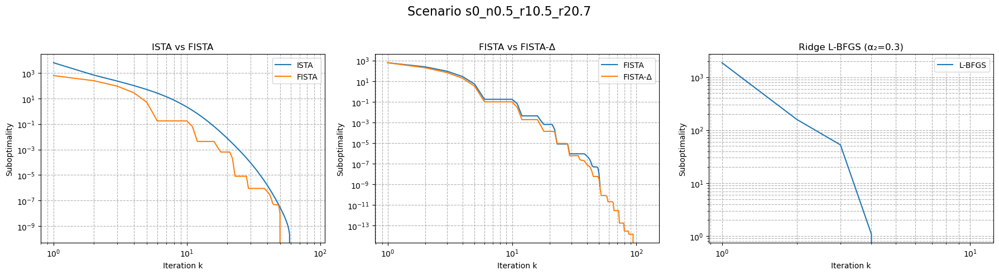

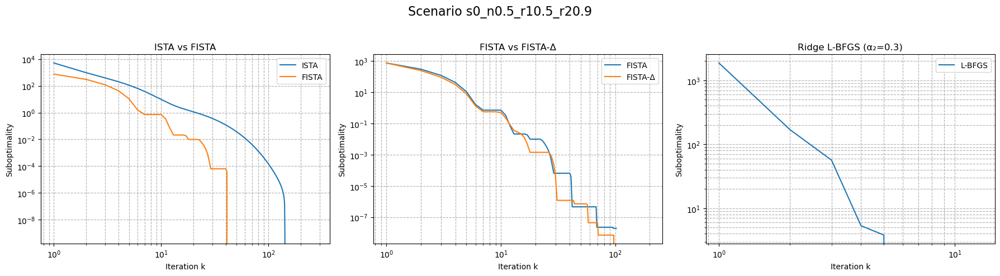

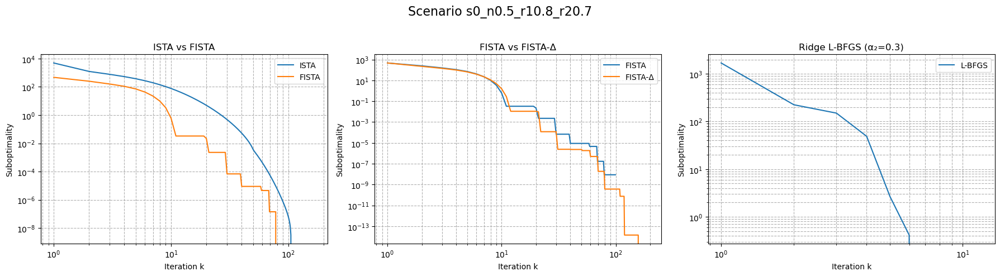

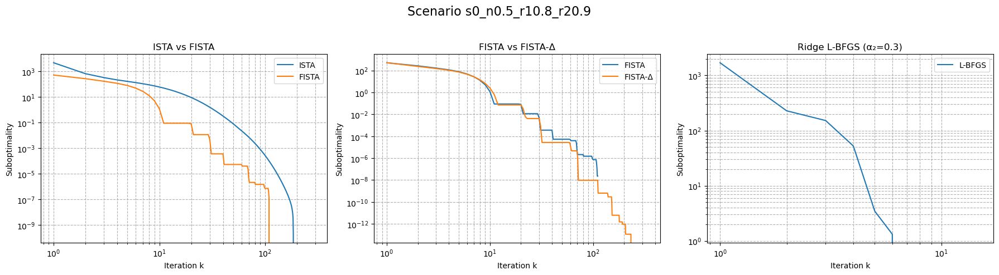

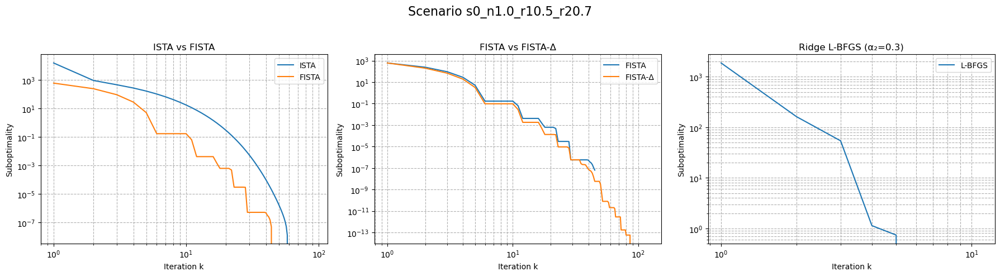

...

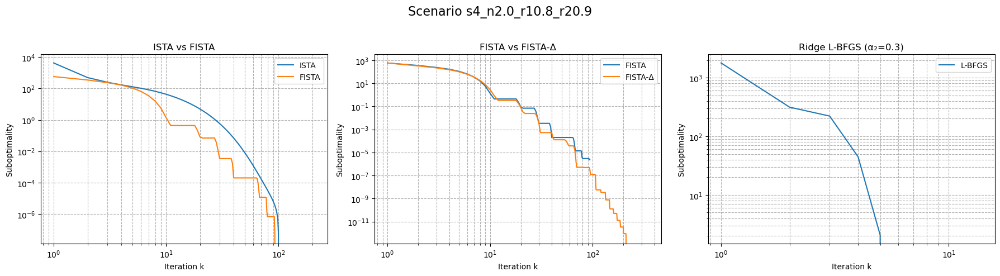

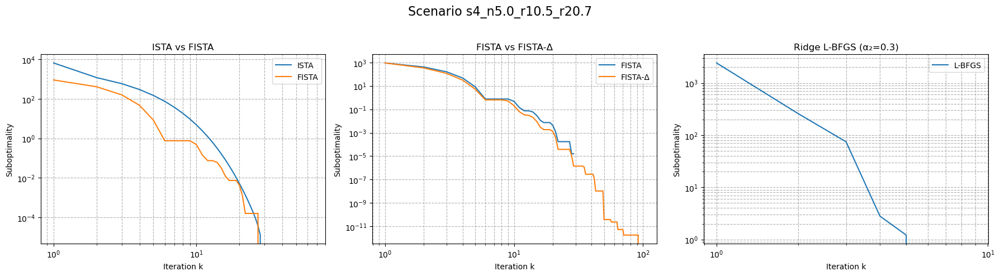

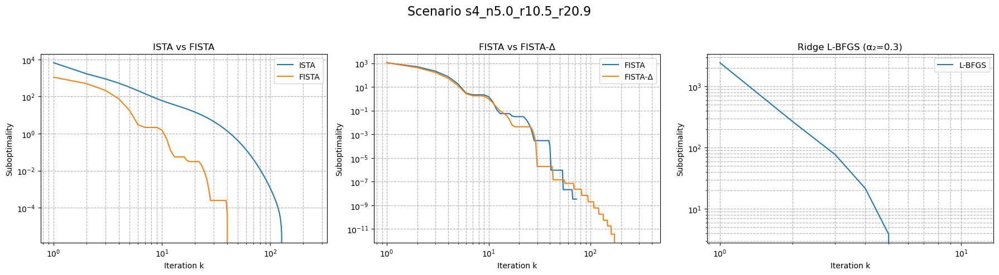

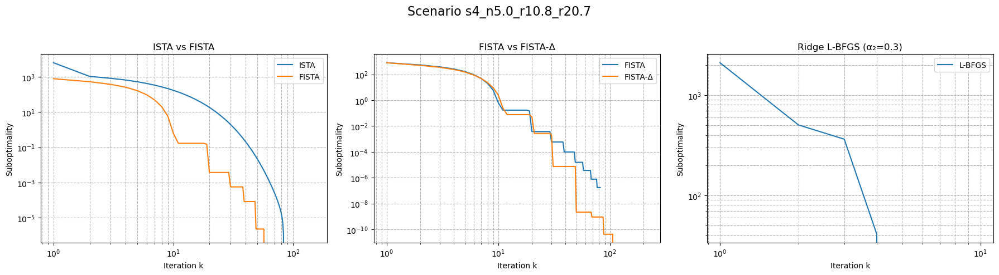

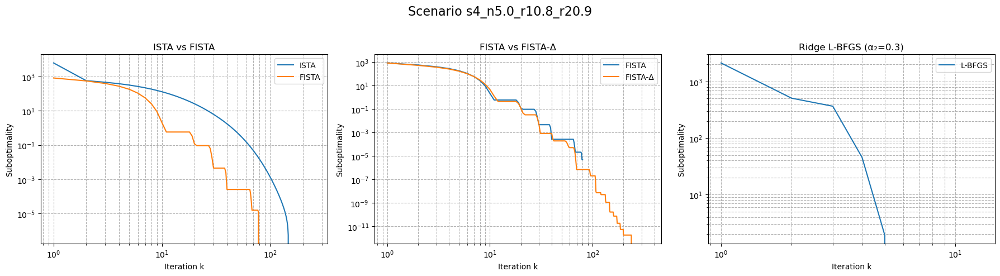

In [ ]:
# — PREPROCESSING & REGULARIZATION SETTINGS (MODIFIED) —
import pandas as pd

basic_regs = [
    {'name':'lasso',      'alpha1':0.3,   'alpha2':0.0},
    {'name':'lasso',      'alpha1':0.6,   'alpha2':0.0},
    {'name':'lasso',      'alpha1':1.0,   'alpha2':0.0},
    {'name':'ridge',      'alpha1':0.0,   'alpha2':0.3},
    {'name':'ridge',      'alpha1':0.0,   'alpha2':0.6},
    {'name':'ridge',      'alpha1':0.0,   'alpha2':1.0},
    {'name':'elasticnet', 'alpha1':0.3,   'alpha2':1e-9},
    {'name':'elasticnet', 'alpha1':1e-6,  'alpha2':0.5},
    {'name':'elasticnet', 'alpha1':0.3,   'alpha2':0.3},
]

# Prepare global collector
all_records = []

# Outer loops: sweep dataset parameters
for seed in seeds:
  rng = np.random.default_rng(seed)
  for noise_std in noise_stds:
    for rho1 in rho1_vals:
      for rho2 in rho2_vals:
        scen_tag = f"s{seed}_n{noise_std}_r1{rho1}_r2{rho2}"

        # generate & standardize
        A, b, x_true = generate_correlated_boston_like_data(
            m=1000, seed=seed,
            noise_std=noise_std,
            rho1=rho1, rho2=rho2
        )
        A = (A - A.mean(axis=0)) / A.std(axis=0)
        b = b - b.mean()

        # set up a 1×3 tile for this scenario
        fig, axes = plt.subplots(1, 3, figsize=(18, 5))
        fig.suptitle(f"Scenario {scen_tag}", fontsize=16)

        # now run your three solver blocks _indented four spaces_ below…
        
        first_plot = True
        # === Baseline: ISTA vs FISTA ===
        n, m = A.shape[1], A.shape[0]
        for reg_idx, reg in enumerate(basic_regs):
          name_raw, a1_raw, a2_raw = reg['name'], reg['alpha1'], reg['alpha2']
          a1, a2 = select_effective_alphas(name_raw, a1_raw, a2_raw)

          if name_raw not in ('lasso','elasticnet'):
            continue

          for rep in range(REPS):
            # define g, grad_g, prox_h, L…
            if name_raw=='lasso':
              def g(x):      return 0.5*np.linalg.norm(A@x - b)**2
              def grad_g(x): return A.T@(A@x - b)
              prox_h = lambda v,t: prox_l1(v, t*a1)
              L = estimate_lipschitz(A)
            else:
              def g(x):      return 0.5*np.linalg.norm(A@x - b)**2 + a2*(x@x)
              def grad_g(x): return A.T@(A@x - b) + 2*a2*x
              prox_h = lambda v,t: prox_elastic_net(v, t, a1, a2)
              L = estimate_lipschitz(A) + 2*a2

            # ISTA
            prox_call_times.clear(); tracemalloc.start()
            t0 = time.perf_counter()

            # TO UNDERSTAND IF IT HAS TO BE REMOVED
            x0 = rng.standard_normal(n)    # random init instead of all‐zeros


            x_i, hist_i = ista(
                x0, g, grad_g, prox_h, L,
                backtracking=True, max_iter=500,
                tol=TOL, return_history=True
            )
            """ x_i, hist_i = ista(
                x0, g, grad_g, prox_h, L,
                backtracking=False, max_iter=500,
                tol=TOL, return_history=True
            ) """
            rt_i = time.perf_counter()-t0; mem_c, mem_p=tracemalloc.get_traced_memory(); tracemalloc.stop()
            stats = get_prox_stats()
            obj_i = [compute_objective(xk,A,b,name_raw,a1,a2) for xk in hist_i['x']]

            # FISTA
            prox_call_times.clear(); tracemalloc.start()
            t0 = time.perf_counter()
            x_f, hist_f = fista(A,b,name_raw,a1,a2,
                                max_iter=500,tol=TOL,return_history=True)
            rt_f = time.perf_counter()-t0; mem_c2, mem_p2=tracemalloc.get_traced_memory(); tracemalloc.stop()
            stats2 = get_prox_stats()
            obj_f = hist_f['obj']

            # plot only first rep
            if first_plot and rep == 0:
              ax = axes[0]
              f_star = obj_f[-1]
              ks_i = np.arange(1, len(obj_i)+1)
              ks_f = np.arange(1, len(obj_f)+1)
              ax.loglog(ks_i, np.minimum.accumulate(obj_i - f_star), '-', label='ISTA')
              ax.loglog(ks_f, np.minimum.accumulate(obj_f - f_star), '-', label='FISTA')
              ax.set_title("ISTA vs FISTA")
              ax.set_xlabel("Iteration k")
              ax.set_ylabel("Suboptimality")
              ax.grid(True, which='both', ls='--')
              ax.legend()
              first_plot = False

            # record
            all_records += [
              dict(scenario=scen_tag, solver='ISTA',      regularizer=name_raw,
                   alpha1=a1,alpha2=a2,iterations=len(obj_i),
                   runtime_s=rt_i,mem_current_b=mem_c,mem_peak_b=mem_p,**stats),
              dict(scenario=scen_tag, solver='FISTA',     regularizer=name_raw,
                   alpha1=a1,alpha2=a2,iterations=len(obj_f),
                   runtime_s=rt_f,mem_current_b=mem_c2,mem_peak_b=mem_p2,**stats2),
            ]

        first_plot = True
        # === FISTA vs FISTA-Δ ===
        for reg_idx, reg in enumerate(basic_regs):
          name_raw,a1_raw,a2_raw=reg['name'],reg['alpha1'],reg['alpha2']
          a1,a2=select_effective_alphas(name_raw,a1_raw,a2_raw)
          if name_raw not in ('lasso','elasticnet') or a1<=0: continue

          for rep in range(REPS):
            prox_call_times.clear(); tracemalloc.start()
            t0=time.perf_counter()
            x_std,hist_std = fista(A,b,name_raw,a1,a2, max_iter=500,tol=TOL,return_history=True)
            rt_std=time.perf_counter()-t0; mem_c,mem_p=tracemalloc.get_traced_memory(); tracemalloc.stop()
            stats_std=get_prox_stats(); obj_std=hist_std['obj']

            prox_call_times.clear(); tracemalloc.start()
            t0=time.perf_counter()
            x_del,obj_del = fista_delta(A,b,name_raw,a1,a2, delta=3.0, max_iter=500,tol=TOL)
            rt_del=time.perf_counter()-t0; mem_c2,mem_p2=tracemalloc.get_traced_memory(); tracemalloc.stop()
            stats_del=get_prox_stats()

            if first_plot and rep == 0:
              ax = axes[1]
              f_star = min(obj_std[-1], obj_del[-1])
              ks_std = np.arange(1, len(obj_std)+1)
              ks_del = np.arange(1, len(obj_del)+1)
              ax.loglog(ks_std, np.minimum.accumulate(obj_std - f_star), '-', label='FISTA')
              ax.loglog(ks_del, np.minimum.accumulate(obj_del - f_star), '-', label='FISTA-Δ')
              ax.set_title("FISTA vs FISTA-Δ")
              ax.set_xlabel("Iteration k")
              ax.set_ylabel("Suboptimality")
              ax.grid(True, which='both', ls='--')
              ax.legend()
              first_plot = False

            all_records += [
              dict(scenario=scen_tag, solver='FISTA',    regularizer=name_raw,
                   alpha1=a1,alpha2=a2,iterations=len(obj_std),
                   runtime_s=rt_std,mem_current_b=mem_c,mem_peak_b=mem_p,**stats_std),
              dict(scenario=scen_tag, solver='FISTA-Δ',  regularizer=name_raw,
                   alpha1=a1,alpha2=a2,iterations=len(obj_del),
                   runtime_s=rt_del,mem_current_b=mem_c2,mem_peak_b=mem_p2,**stats_del),
            ]

        first_plot = True
        # === Ridge via L-BFGS ===
        for reg_idx, reg in enumerate(basic_regs):
          name_raw,a1_raw,a2_raw=reg['name'],reg['alpha1'],reg['alpha2']
          a1,a2=select_effective_alphas(name_raw,a1_raw,a2_raw)
          if not (name_raw=='ridge' or (name_raw=='elasticnet' and a1_raw<1e-8)): continue

          for rep in range(REPS):
            solver=LBFGSSolver(reg_type='ridge',alpha1=0.0,alpha2=a2,max_iter=500,tol=TOL)
            prox_call_times.clear(); tracemalloc.start()
            t0=time.perf_counter(); solver.fit(A,b)
            rt_lbfgs=time.perf_counter()-t0; mem_c,mem_p=tracemalloc.get_traced_memory(); tracemalloc.stop()
            stats_l=get_prox_stats()

            if first_plot and rep == 0:
              ax = axes[2]
              ks = np.arange(1, len(solver.history_)+1)
              ax.loglog(ks, np.minimum.accumulate(solver.history_ - solver.final_obj_), '-', label='L-BFGS')
              ax.set_title(f"Ridge L-BFGS (α₂={a2})")
              ax.set_xlabel("Iteration k")
              ax.set_ylabel("Suboptimality")
              ax.grid(True, which='both', ls='--')
              ax.legend()
              first_plot = False

            all_records.append(
              dict(scenario=scen_tag,solver='L-BFGS',regularizer=name_raw,
                   alpha1=0.0,alpha2=a2,iterations=len(solver.history_),
                   runtime_s=rt_lbfgs,mem_current_b=mem_c,mem_peak_b=mem_p,**stats_l)
            )
        
        plt.tight_layout(rect=[0,0,1,0.95])  # leave room for the fig.suptitle
        plt.show()

# end of nested loops

In [ ]:
# — FINAL METRICS SUMMARY TABLE FOR ALL SCENARIOS —
import pandas as pd

df_metrics = pd.DataFrame(all_records)

metrics = [
  'iterations','runtime_s',
  'prox_min_s','prox_max_s','prox_mean_s','prox_var_s','prox_std_s',
  'mem_current_b','mem_peak_b'
]

summary = (
  df_metrics
    .groupby(['scenario','solver','regularizer','alpha1','alpha2'])[metrics]
    .agg(['min','max','mean','var','std'])
    .reset_index()
)

# flatten MultiIndex columns
summary.columns = ['_'.join(filter(None,col)).strip('_')
                   for col in summary.columns.to_flat_index()]

pd.set_option('display.float_format','{:.6f}'.format)
print(summary)

                 scenario  solver regularizer   alpha1   alpha2  \
0     s0_n0.5_r10.5_r20.7   FISTA  elasticnet 0.000001 0.500000   
1     s0_n0.5_r10.5_r20.7   FISTA  elasticnet 0.300000 0.000000   
2     s0_n0.5_r10.5_r20.7   FISTA  elasticnet 0.300000 0.300000   
3     s0_n0.5_r10.5_r20.7   FISTA       lasso 0.300000 0.000000   
4     s0_n0.5_r10.5_r20.7   FISTA       lasso 0.600000 0.000000   
...                   ...     ...         ...      ...      ...   
1675  s4_n5.0_r10.8_r20.9    ISTA       lasso 0.600000 0.000000   
1676  s4_n5.0_r10.8_r20.9    ISTA       lasso 1.000000 0.000000   
1677  s4_n5.0_r10.8_r20.9  L-BFGS       ridge 0.000000 0.300000   
1678  s4_n5.0_r10.8_r20.9  L-BFGS       ridge 0.000000 0.600000   
1679  s4_n5.0_r10.8_r20.9  L-BFGS       ridge 0.000000 1.000000   

      iterations_min  iterations_max  iterations_mean  iterations_var  \
0                 46              46        46.000000        0.000000   
1                 51              51        51.00